
---

## 📌 หัวข้อการบ้าน: การสร้างไอเดียผลิตภัณฑ์ใหม่ด้วย AI Image Generation และ Editing


---

### 🧠 คำอธิบายโจทย์

คุณได้รับมอบหมายให้เป็นนักออกแบบผลิตภัณฑ์ และนักสร้างสื่อโฆษณา โดยใช้ **OpenAI Image Generation และ Editing ** เพื่อสร้างไอเดียผลิตภัณฑ์ใหม่จาก **text prompt** และนำภาพเหล่านั้นไป **ตกแต่ง ปรับแก้** และสร้างเป็น **สื่อประชาสัมพันธ์** (ad content)

---

### ✅ สิ่งที่ต้องทำ (Tasks)

1. **สร้าง Prompt** อย่างน้อย 3 ชุด สำหรับการสร้างภาพผลิตภัณฑ์ใหม่ (เช่น น้ำหอม, ของขวัญ, เครื่องเขียน, อุปกรณ์ไอที ฯลฯ)
2. **เรียกใช้ OpenAI Image Generation API** เพื่อสร้างภาพตาม prompt
3. **นำภาพเหล่านั้นมาแก้ไข** ด้วย OpenAI Image Editing API (สามารถใส่ข้อความ, เปลี่ยนสีพื้นหลัง, เพิ่มโลโก้ หรือวัตถุเพิ่มเติม)
4. **ออกแบบสื่อโฆษณา (Ad Poster)** โดยนำภาพที่ได้มาตกแต่งประกอบกับข้อความสั้นๆ เช่น คำโปรย, โลโก้, ชื่อแบรนด์ ฯลฯ
5. **จัดทำเนื้อหา (content)** ที่อธิบายผลิตภัณฑ์นั้น เช่น คุณสมบัติ, ประโยชน์, ราคาแนะนำ
6. **รวมทั้งหมดลงใน Jupyter Notebook** โดยอธิบายแต่ละขั้นตอน พร้อมแสดงรูปภาพและโค้ดที่ใช้

---

### 🧪 ข้อเสนอแนะในการใช้เทคนิค

* ใช้ `base64` ในการ encode รูปภาพ
* ใช้ `matplotlib.pyplot` เพื่อแสดงภาพใน notebook

---

### 📦 สิ่งที่ต้องส่ง

* ไฟล์ Jupyter Notebook `.ipynb` ที่มี:

  * โค้ดที่ทำงานได้
  * คำอธิบายทุกขั้นตอน
  * Prompt ที่ใช้
  * ภาพต้นฉบับ และภาพที่ถูกแก้ไข
  * ภาพสื่อโฆษณาสุดท้าย
  * คำอธิบายผลิตภัณฑ์

---

### 🌟 ตัวอย่างไอเดียผลิตภัณฑ์ 

* เทียนหอมกลิ่นผลไม้ดีไซน์ไทย
* ชุดของขวัญสปาสำหรับแมวดีไซน์ไทย
* กล่องใส่ของเล่นเด็กอัจฉริยะ
* ปากกา AI ที่สามารถแปลภาษาได้
* กระเป๋าแฟชั่นวัสดุรีไซเคิล

---

### 💡 เกณฑ์การให้คะแนน (รวม 10 คะแนน)

| รายการ                          | คะแนน |
| ------------------------------- | ----- |
| ความคิดสร้างสรรค์ของผลิตภัณฑ์   | 2     |
| ความถูกต้องของการใช้ API        | 2     |
| การใช้ Prompt และการแก้ไขภาพ    | 2     |
| ความสวยงามของสื่อโฆษณา          | 2     |
| ความสมบูรณ์ของ Jupyter Notebook | 2     |

---



In [10]:
import IPython
import os
from openai import OpenAI
from dotenv import load_dotenv

def clean_notebook():
    IPython.display.clear_output(wait=True)
    print("Notebook cleaned.")

!pip install openai
!pip install gradio
!pip install python-dotenv
!pip install matplotlib
!pip install Pillow

load_dotenv()
openai_client = OpenAI(api_key=os.getenv("OPENAI_API_KEY"))
clean_notebook()

Notebook cleaned.


In [11]:
import base64
import matplotlib.pyplot as plt
from PIL import Image

def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")
    
def gen_image(prompt):
    response = openai_client.images.generate(
        model="gpt-image-1",  # "dall-e-1" or "dall-e-2", "gpt-image-1"
        prompt=prompt,
        size="1024x1024",
        quality="medium",   # Use 'low', 'medium', 'high', or 'auto'
        n=1
    )
    return response.data[0].b64_json

def edit_image(prompt, base64_image1, base64_image2, base64_image3):
    response = openai_client.responses.create(
        model="gpt-4.1",
        input=[
            {
                "role": "user",
                "content": [
                    {"type": "input_text", "text": prompt},
                    {
                        "type": "input_image",
                        "image_url": f"data:image/jpeg;base64,{base64_image1}",
                    },
                    {
                        "type": "input_image",
                        "image_url": f"data:image/jpeg;base64,{base64_image2}",
                    },
                    {
                        "type": "input_image",
                        "image_url": f"data:image/jpeg;base64,{base64_image3}",
                    },
                    
                ],
            }
        ],
        tools=[{"type": "image_generation"}],
    )

    image_generation_calls = [
        output
        for output in response.output
        if output.type == "image_generation_call"
    ]

    image_data = [output.result for output in image_generation_calls]

    if image_data:
        image_base64 = image_data[0]
        return image_base64
    else:
        return response.output.content
    
def save_image(name, image_base64):
    with open(f"{name}.png", "wb") as f:
        f.write(base64.b64decode(image_base64))

def show_image(path):
    image = Image.open(path)
    plt.imshow(image)
    plt.axis('off')
    plt.show()

    


In [ ]:
prompt_for_gen_image =[
    "A traditional Thai-style ceramic teapot with a rounded body and a curved spout. It features elegant blue and white lotus or floral patterns and a glossy glazed finish, representing classic Thai craftsmanship.",
    "A selection of dried Thai herbs such as lemongrass, ginger, pandan leaves, and kaffir lime. They are beautifully arranged in small ceramic bowls or on a bamboo tray, used for making herbal tea or as decorative elements.",
    "A set of 2 to 4 small ceramic tea cups matching the teapot in design and color. The cups are placed neatly on a bamboo tray or low wooden table, creating a warm and culturally rich tea-serving scene."
]
img_list = []

for index, prompt in enumerate(prompt_for_gen_image):
    img_base64 = gen_image(prompt)
    img_list.append(img_base64)

img_list


['iVBORw0KGgoAAAANSUhEUgAABAAAAAQACAIAAADwf7zUAAFDymNhQlgAAUPKanVtYgAAAB5qdW1kYzJwYQARABCAAACqADibcQNjMnBhAAAANxNqdW1iAAAAR2p1bWRjMm1hABEAEIAAAKoAOJtxA3VybjpjMnBhOjUzZGM2YjI3LTRmYjYtNGM4Yi1hZjg0LWU5MGRjZTY3ZTQ4YQAAAAHhanVtYgAAAClqdW1kYzJhcwARABCAAACqADibcQNjMnBhLmFzc2VydGlvbnMAAAABBWp1bWIAAAApanVtZGNib3IAEQAQgAAAqgA4m3EDYzJwYS5hY3Rpb25zLnYyAAAAANRjYm9yoWdhY3Rpb25zgqNmYWN0aW9ubGMycGEuY3JlYXRlZG1zb2Z0d2FyZUFnZW50v2RuYW1lZkdQVC00b/9xZGlnaXRhbFNvdXJjZVR5cGV4Rmh0dHA6Ly9jdi5pcHRjLm9yZy9uZXdzY29kZXMvZGlnaXRhbHNvdXJjZXR5cGUvdHJhaW5lZEFsZ29yaXRobWljTWVkaWGiZmFjdGlvbm5jMnBhLmNvbnZlcnRlZG1zb2Z0d2FyZUFnZW50v2RuYW1lak9wZW5BSSBBUEn/AAAAq2p1bWIAAAAoanVtZGNib3IAEQAQgAAAqgA4m3EDYzJwYS5oYXNoLmRhdGEAAAAAe2Nib3KlamV4Y2x1c2lvbnOBomVzdGFydBghZmxlbmd0aBk3RWRuYW1lbmp1bWJmIG1hbmlmZXN0Y2FsZ2ZzaGEyNTZkaGFzaFggJWmQNe6WIQ5WbtQvcYjv/vKfLBydAFdGAF4+sKpNLsJjcGFkSAAAAAAAAAAAAAAB5mp1bWIAAAAnanVtZGMyY2wAEQAQgAAAqgA4m3EDYzJwYS5jbGFpbS52MgAAAAG3Y2JvcqZqaW5zdGFuY2VJRHgseG1wOmlpZDpmMTMxNGQ4Ni1lYzQ3LTRiOGMtOTJlMC02MzUwY2YyMG

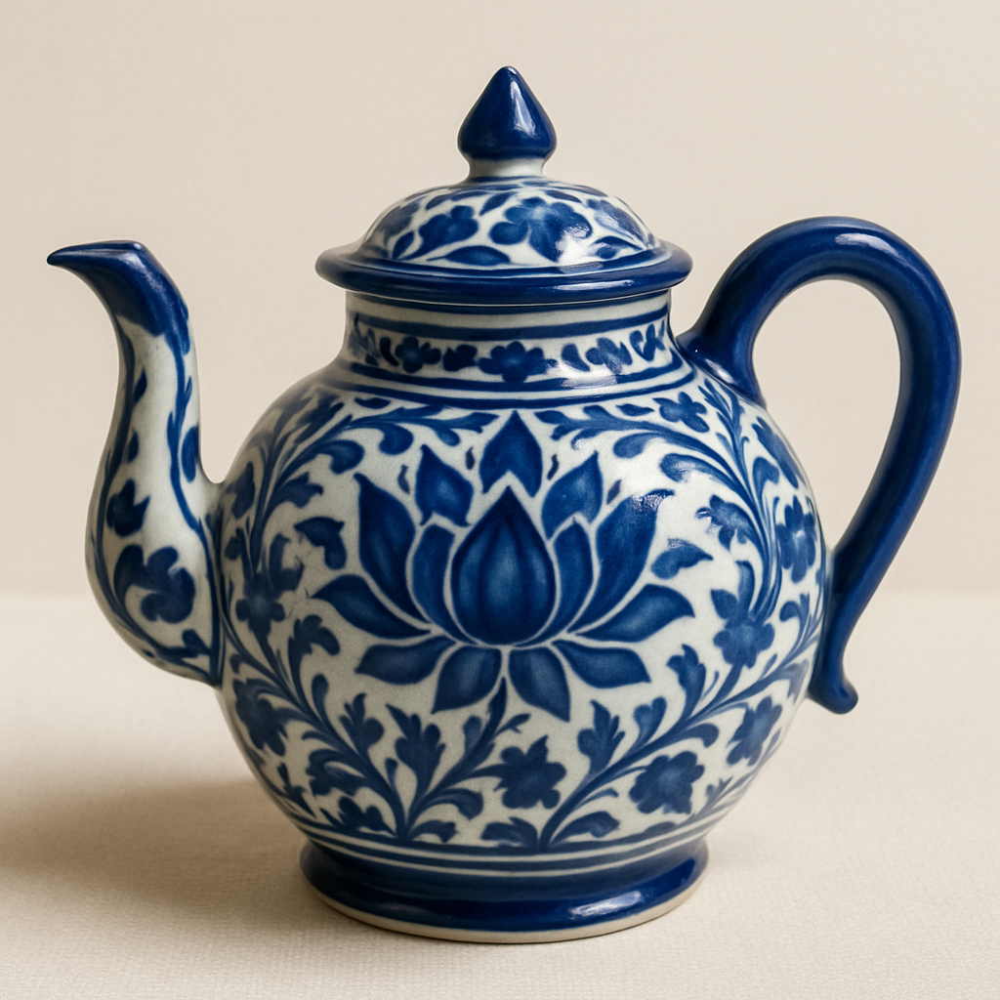

In [22]:
from IPython.display import Image, display
import base64

# ฝังภาพให้แสดงและแนบติดไปกับไฟล์ .ipynb
with open("1.png", "rb") as f:
    img_data = base64.b64encode(f.read()).decode()

display(Image(data=base64.b64decode(img_data)))


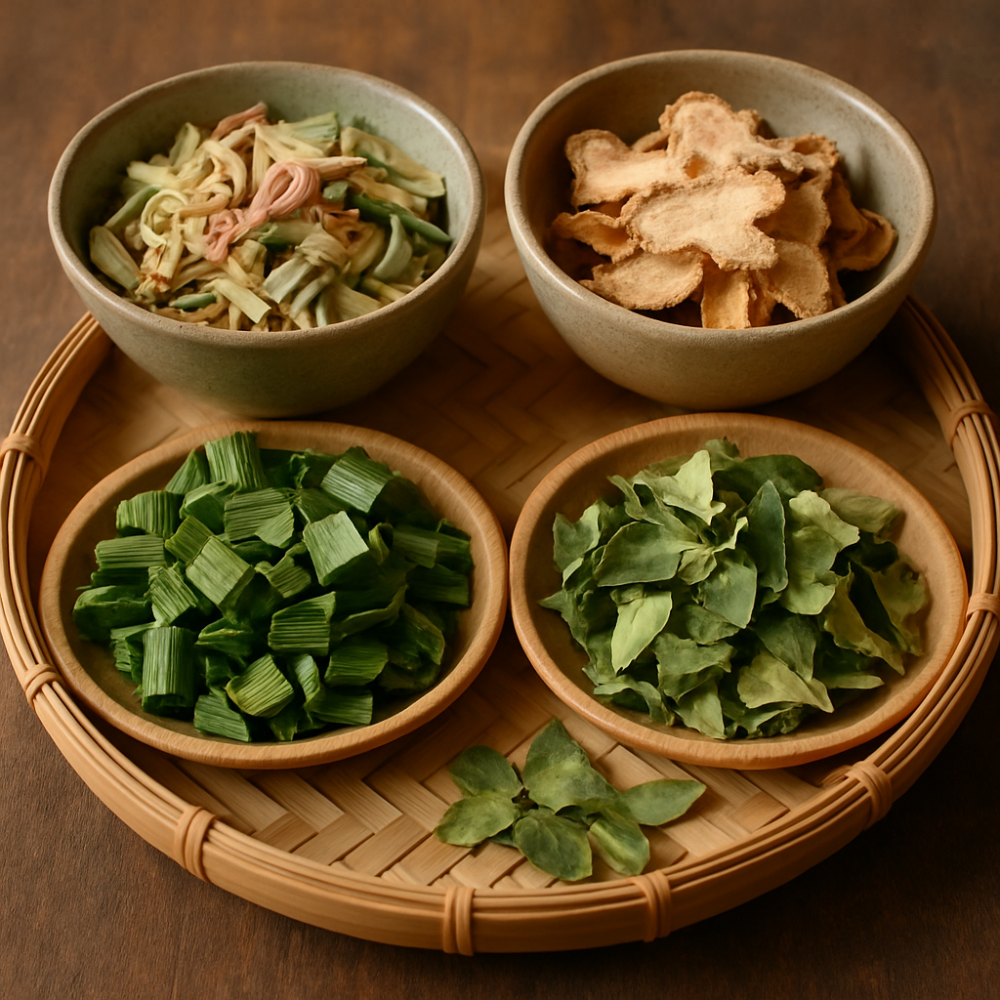

In [23]:
from IPython.display import Image, display
import base64

# ฝังภาพให้แสดงและแนบติดไปกับไฟล์ .ipynb
with open("2.png", "rb") as f:
    img_data = base64.b64encode(f.read()).decode()

display(Image(data=base64.b64decode(img_data)))


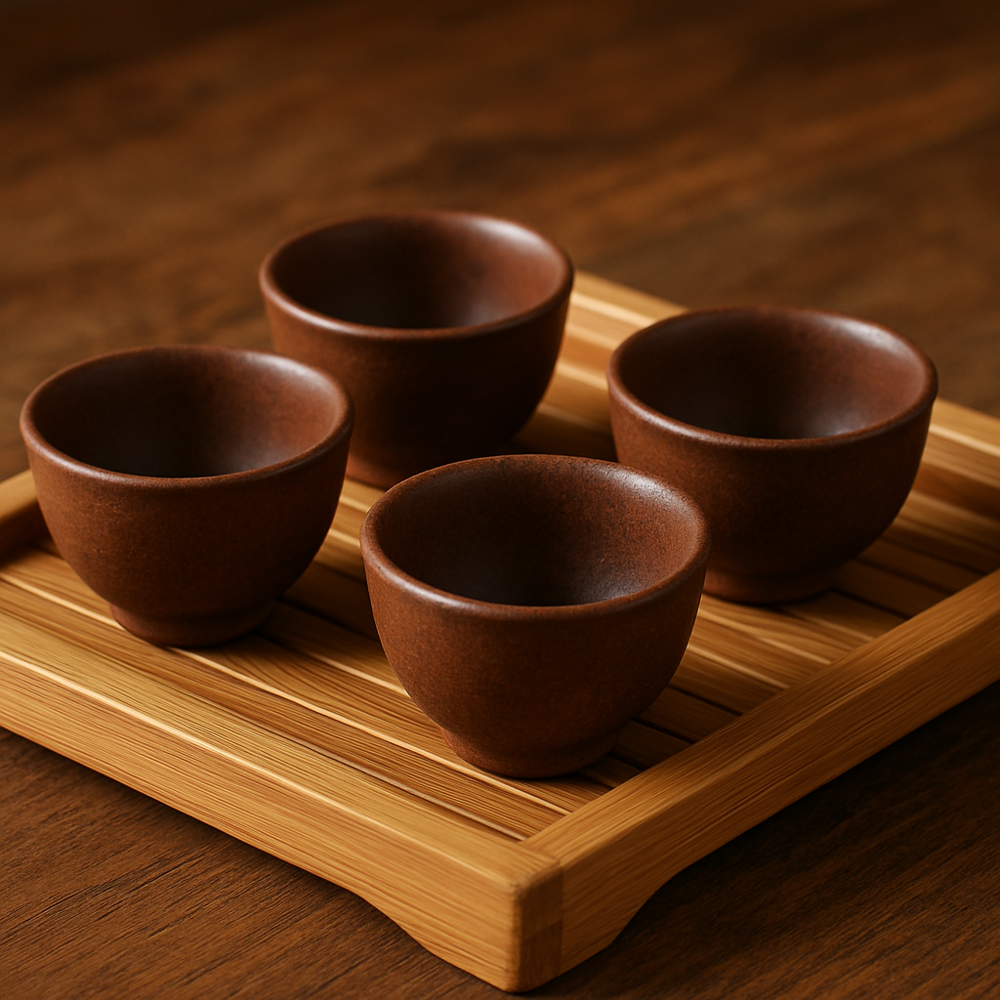

In [24]:
from IPython.display import Image, display
import base64

# ฝังภาพให้แสดงและแนบติดไปกับไฟล์ .ipynb
with open("3.png", "rb") as f:
    img_data = base64.b64encode(f.read()).decode()

display(Image(data=base64.b64decode(img_data)))


In [18]:
prompt_for_product = """Generate an image of a tea set scene on a clean white background, 
labeled 'Herbal Thai Tea Set' in a ribbon with a handwriting-style font. 
The composition should include a traditional Thai ceramic teapot with blue and white floral patterns, 
a set of 2–4 matching small tea cups, and small bowls containing dried Thai herbs 
such as lemongrass, ginger, pandan leaves, and kaffir lime. 
Arrange all items neatly as a product showcase with a warm, calm atmosphere, 
emphasizing Thai cultural elegance and natural materials."""

result_64 = edit_image(prompt_for_product, img_list[0], img_list[1], img_list[2])
    


In [19]:
save_image("result", result_64)

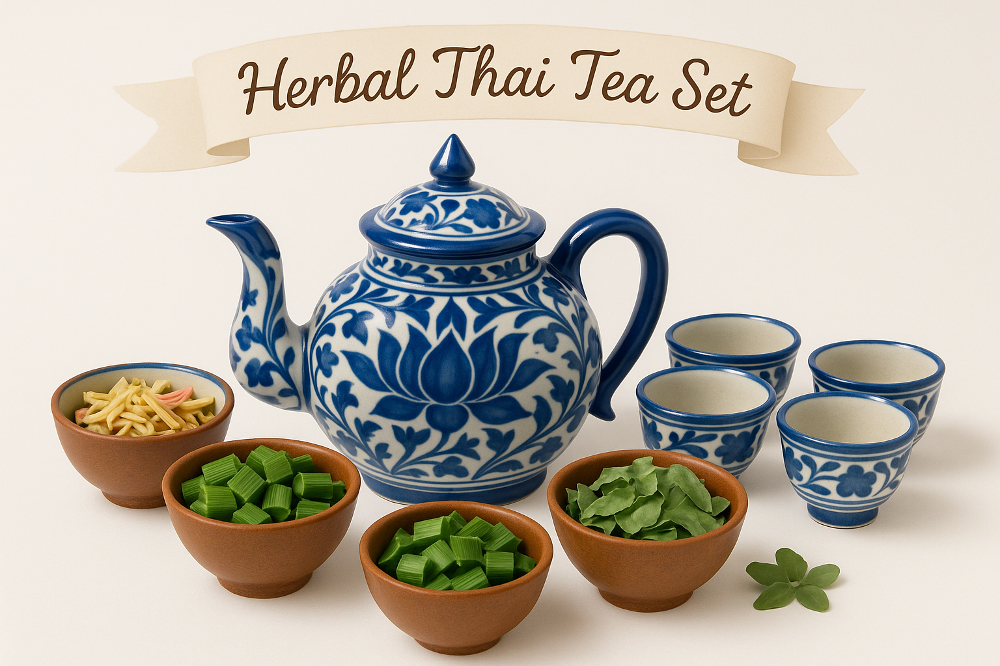

In [25]:
from IPython.display import Image, display
import base64

# ฝังภาพให้แสดงและแนบติดไปกับไฟล์ .ipynb
with open("result.png", "rb") as f:
    img_data = base64.b64encode(f.read()).decode()

display(Image(data=base64.b64decode(img_data)))
